<a href="https://colab.research.google.com/github/sbashkueva/EDA_Airbnb_data/blob/main/EDA_Airbnb_European_cities.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import phik
from phik.report import plot_correlation_matrix
from phik import report
from pandas_profiling import ProfileReport

#Importing the data
Fist we upload data and concatenate different files for cities and days of the week into one DataFrame.

In [6]:
path = '../data/'
amsterdam_weekends=pd.read_csv(path+'amsterdam_weekends.csv')
amsterdam_weekends['day'] = 'weekend'
amsterdam_weekdays = pd.read_csv(path+'amsterdam_weekdays.csv')
amsterdam_weekdays['day'] = 'weekday'
amsterdam = pd.concat([amsterdam_weekends, amsterdam_weekdays], join="inner")
amsterdam['city'] = 'Amsterdam'

athens_weekends=pd.read_csv(path+'athens_weekends.csv')
athens_weekends['day'] = 'weekend'
athens_weekdays = pd.read_csv(path+'athens_weekdays.csv')
athens_weekdays['day'] = 'weekday'
athens = pd.concat([athens_weekends, athens_weekdays], join="inner")
athens['city'] = 'Athens'

barcelona_weekends=pd.read_csv(path+'barcelona_weekends.csv')
barcelona_weekends['day'] = 'weekend'
barcelona_weekdays = pd.read_csv(path+'barcelona_weekdays.csv')
barcelona_weekdays['day'] = 'weekday'
barcelona = pd.concat([barcelona_weekends, barcelona_weekdays], join="inner")
barcelona['city'] = 'Barcelona'

berlin_weekends=pd.read_csv(path+'berlin_weekends.csv')
berlin_weekends['day'] = 'weekend'
berlin_weekdays = pd.read_csv(path+'berlin_weekdays.csv')
berlin_weekdays['day'] = 'weekday'
berlin = pd.concat([berlin_weekends, berlin_weekdays], join="inner")
berlin['city'] = 'Berlin'

budapest_weekends=pd.read_csv(path+'budapest_weekends.csv')
budapest_weekends['day'] = 'weekend'
budapest_weekdays = pd.read_csv(path+'budapest_weekdays.csv')
budapest_weekdays['day'] = 'weekday'
budapest = pd.concat([budapest_weekends, budapest_weekdays], join="inner")
budapest['city'] = 'Budapest'

lisbon_weekends=pd.read_csv(path+'lisbon_weekends.csv')
lisbon_weekends['day'] = 'weekend'
lisbon_weekdays = pd.read_csv(path+'lisbon_weekdays.csv')
lisbon_weekdays['day'] = 'weekday'
lisbon = pd.concat([lisbon_weekends, lisbon_weekdays], join="inner")
lisbon['city'] = 'Lisbon'

london_weekends=pd.read_csv(path+'london_weekends.csv')
london_weekends['day'] = 'weekend'
london_weekdays = pd.read_csv(path+'london_weekdays.csv')
london_weekdays['day'] = 'weekday'
london = pd.concat([london_weekends, london_weekdays], join="inner")
london['city'] = 'London'

paris_weekends=pd.read_csv(path+'paris_weekends.csv')
paris_weekends['day'] = 'weekend'
paris_weekdays = pd.read_csv(path+'paris_weekdays.csv')
paris_weekdays['day'] = 'weekday'
paris = pd.concat([paris_weekends, paris_weekdays], join="inner")
paris['city'] = 'Paris'

rome_weekends=pd.read_csv(path+'rome_weekends.csv')
rome_weekends['day'] = 'weekend'
rome_weekdays = pd.read_csv(path+'rome_weekdays.csv')
rome_weekdays['day'] = 'weekday'
rome = pd.concat([rome_weekends, rome_weekdays], join="inner")
rome['city'] = 'Rome'

vienna_weekends=pd.read_csv(path+'vienna_weekends.csv')
vienna_weekends['day'] = 'weekend'
vienna_weekdays = pd.read_csv(path+'vienna_weekdays.csv')
vienna_weekdays['day'] = 'weekday'
vienna = pd.concat([vienna_weekends, vienna_weekdays], join="inner")
vienna['city'] = 'Vienna'

cities = pd.concat([amsterdam, athens, barcelona, berlin, budapest, lisbon, london, \
                    paris, rome, vienna], join="inner")
countries = {'Amsterdam': 'Netherlands', 'Athens': 'Greece', 'Barcelona': 'Spain', \
             'Berlin': 'Germany','Budapest': 'Hungary', 'Lisbon': 'Portugal', \
             'London': 'Great Britain', 'Paris': 'France', 'Rome': 'Italy', 'Vienna': 'Austria'}
cities['country'] = cities['city'].map(countries)
cities['price'] = cities['realSum'] / 2
cities

,Unnamed: 0,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,...,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,day,city,country,price
0,0,319.640053,Private room,False,True,2.0,False,0,1,9.0,...,110.906123,5.871971,136.982208,11.941560,4.84639,52.34137,weekend,Amsterdam,Netherlands,159.820027
1,1,347.995219,Private room,False,True,2.0,False,0,1,9.0,...,75.275937,3.985516,95.386468,8.315410,4.97512,52.36103,weekend,Amsterdam,Netherlands,173.997610
2,2,482.975183,Private room,False,True,4.0,False,0,1,9.0,...,493.272517,26.116521,875.114817,76.289005,4.89417,52.37663,weekend,Amsterdam,Netherlands,241.487592
3,3,485.552926,Private room,False,True,2.0,True,0,0,10.0,...,552.849514,29.270850,815.303994,71.074937,4.90051,52.37508,weekend,Amsterdam,Netherlands,242.776463
4,4,2771.541724,Entire home/apt,False,False,4.0,True,0,0,10.0,...,208.809162,11.055489,272.315202,23.739349,4.88467,52.38749,weekend,Amsterdam,Netherlands,1385.770862
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1733,1733,219.012224,Entire home/apt,False,False,4.0,False,0,0,8.0,...,851.189543,60.958556,593.167136,14.180090,16.37766,48.20875,weekday,Vienna,Austria,109.506112
1734,1734,191.197438,Entire home/apt,False,False,4.0,False,0,1,10.0,...,195.654600,14.011946,305.781569,7.309930,16.37892,48.19973,weekday,Vienna,Austria,95.598719
1735,1735,251.501765,Entire home/apt,False,False,2.0,False,0,0,8.0,...,204.967222,14.678876,342.177253,8.179995,16.38070,48.20296,weekday,Vienna,Austria,125.750882
1736,1736,637.636444,Entire home/apt,False,False,2.0,False,0,0,10.0,...,169.074867,12.108419,282.299117,6.748565,16.38568,48.20460,weekday,Vienna,Austria,318.818222


#Inspecting the data
Pandas profiling report indicates that:
1. The data is clean: there are no duplicates and missing data for all variables.
2. Almost all listings stand for Entire homes / apt and Private rooms, while Shared rooms are very rare.
3. The distribution of price variable is right-skewed which means there is a number of outliers with very high prices.
4. Ratings variables (cleanliness and satisfaction) have left-skewed distributions which means that guests tend to grant high ratings for their stays.
5. Sample structure in terms of days of the week is close to uniform.


In [8]:
ProfileReport(cities)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
cities.describe()

,Unnamed: 0,realSum,person_capacity,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,price
count,51707.000000,51707.000000,51707.000000,51707.000000,51707.000000,51707.000000,51707.000000,51707.00000,51707.000000,51707.000000,51707.000000,51707.000000,51707.000000,51707.000000,51707.000000,51707.000000,51707.000000
mean,1620.502388,279.879591,3.161661,0.291353,0.350204,9.390624,92.628232,1.15876,3.191285,0.681540,294.204105,13.423792,626.856696,22.786177,7.426068,45.671128,139.939796
std,1217.380366,327.948386,1.298545,0.454390,0.477038,0.954868,8.945531,0.62741,2.393803,0.858023,224.754123,9.807985,497.920226,17.804096,9.799725,5.249263,163.974193
min,0.000000,34.779339,2.000000,0.000000,0.000000,2.000000,20.000000,0.00000,0.015045,0.002301,15.152201,0.926301,19.576924,0.592757,-9.226340,37.953000,17.389670
25%,646.000000,148.752174,2.000000,0.000000,0.000000,9.000000,90.000000,1.00000,1.453142,0.248480,136.797385,6.380926,250.854114,8.751480,-0.072500,41.399510,74.376087
50%,1334.000000,211.343089,3.000000,0.000000,0.000000,10.000000,95.000000,1.00000,2.613538,0.413269,234.331748,11.468305,522.052783,17.542238,4.873000,47.506690,105.671544
75%,2382.000000,319.694287,4.000000,1.000000,1.000000,10.000000,99.000000,1.00000,4.263077,0.737840,385.756381,17.415082,832.628988,32.964603,13.518825,51.471885,159.847143
max,5378.000000,18545.450285,6.000000,1.000000,1.000000,10.000000,100.000000,10.00000,25.284557,14.273577,4513.563486,100.000000,6696.156772,100.000000,23.786020,52.641410,9272.725142


Correlation matrix with Phik (𝜙 k) correlation coefficients that are a good metric for different kinds of variables: both categorical and quantitative.

We see meaningful positive correlation:
* between price per night and number of bedrooms,
* between guest satisfaction rating and cleanliness rating, superhost status, business host status.

interval columns not set, guessing: ['Unnamed: 0', 'realSum', 'person_capacity', 'multi', 'biz', 'cleanliness_rating', 'guest_satisfaction_overall', 'bedrooms', 'dist', 'metro_dist', 'attr_index', 'attr_index_norm', 'rest_index', 'rest_index_norm', 'lng', 'lat', 'price']


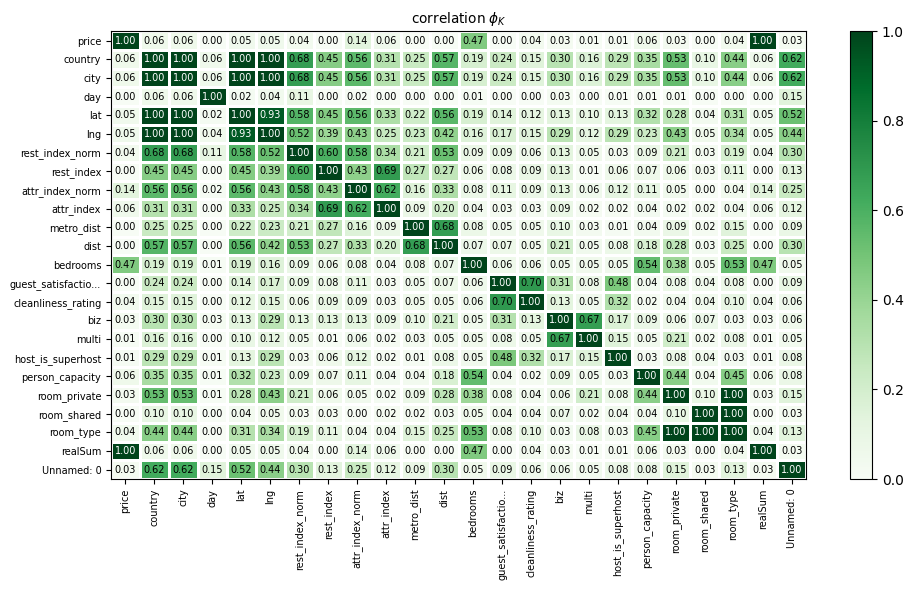

In [10]:
phik_overview = cities.phik_matrix()
phik_overview.round(2)
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=0.7, 
                        figsize=(10, 6))
plt.tight_layout()

# **1. Prices on weekdays and weekends**

* We can observe price differences on weekdays and weekends across cities. The biggest difference is in Amsterdam and Budapest, the smallest one - in Athens and Paris.  Meanwhile, in Barcelona prices on weekdays are higher than on weekends.
* But if we look at the median prices across cities and accommodation types, we see that the difference in prices during the week is not that sufficient. For example, most observations on weekends in Amsterdam stand for Entire homes/apt which are more expensive than rooms, while on weekdays observations are split ~50/50 between Entire homes/apt and rooms. This difference in data structure can explain price difference during the week.

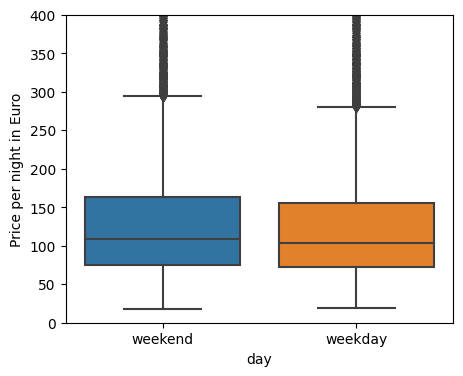

In [12]:
fig, ax = plt.subplots(figsize = (5, 4))
ax = sns.boxplot(data=cities, x='day', y='price')
ax.set_ylabel('Price per night in Euro')
ax.set_ylim(0,400)

plt.show()

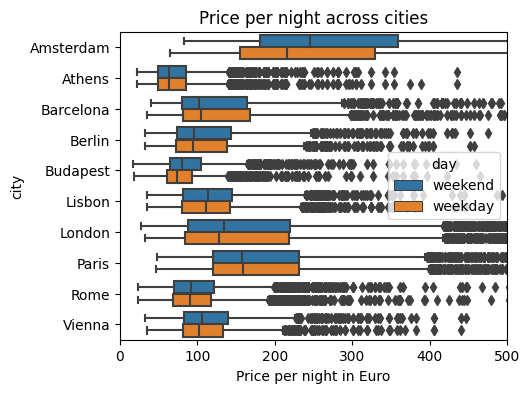

In [13]:
fig, ax = plt.subplots(figsize = (5, 4))
ax = sns.boxplot(x = 'price', y = 'city', data = cities, hue = 'day')
ax.set_title('Price per night across cities')
ax.set_xlabel('Price per night in Euro')
ax.set_xlim(0,500)

plt.show()

In [14]:
day = cities.groupby(['city', 'day'])['price'].median().unstack()
day['price diff %'] = (day['weekend'] / day['weekday'] - 1) * 100
day.sort_values(by='price diff %', ascending=False)

day,weekday,weekend,price diff %
city,,,
Amsterdam,215.124317,245.822886,14.270153
Budapest,73.729849,80.015980,8.525896
London,128.177991,134.057715,4.587156
Vienna,102.260244,106.000047,3.657143
Rome,89.893157,92.231080,2.600780
Berlin,93.893148,96.230251,2.489110
Lisbon,111.515009,113.860225,2.103049
Athens,63.857709,63.857709,0.000000
Paris,159.264610,158.099543,-0.731529


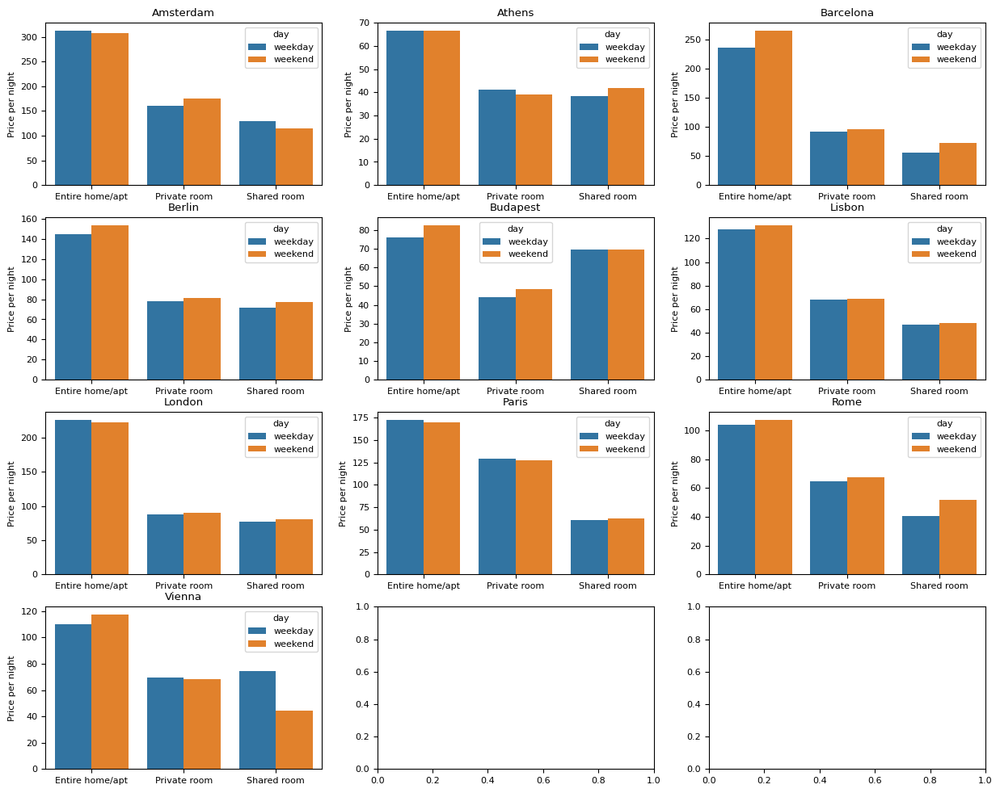

In [15]:
plt.rcParams.update({'font.size': 8})

fig, ax = plt.subplots(4, 3, figsize = (15, 12))

city = [i for i in cities['city'].unique()]
axes = [ax[0,0], ax[0,1], ax[0,2], ax[1,0], ax[1,1], ax[1,2], ax[2,0], ax[2,1], ax[2,2], ax[3,0]]

for i, j in zip(city, axes):
  sns.barplot(data = cities[cities['city']==i], 
                x = 'room_type', 
                y = 'price', 
                hue = 'day',
                order=['Entire home/apt', 'Private room', 'Shared room'],
                errorbar = None, ax = j,
                estimator = np.median, 
                hue_order = ['weekday', 'weekend']).\
                set(title = i, xlabel = None,\
                    ylabel = 'Price per night')

plt.show()

In [17]:
fig = px.sunburst(cities[cities['city']=='Amsterdam'], 
                  path = ['day','room_type'],
                  color = 'price',
                  height = 400, width = 800,
                  title = 'Amsterdam sample across days of the week and accommodation types')

fig.show()

#**2. Prices and distances across accommodation types** 

* Higher prices are indicated for observations with shorter distance from the city center / subway and for Entire home / apartments.

* This correlation differs across cities. For example, in London, where the distances are longer, there is the relationship between the distance and prices. In Paris, where distances are shorter, we do not see such an influence.

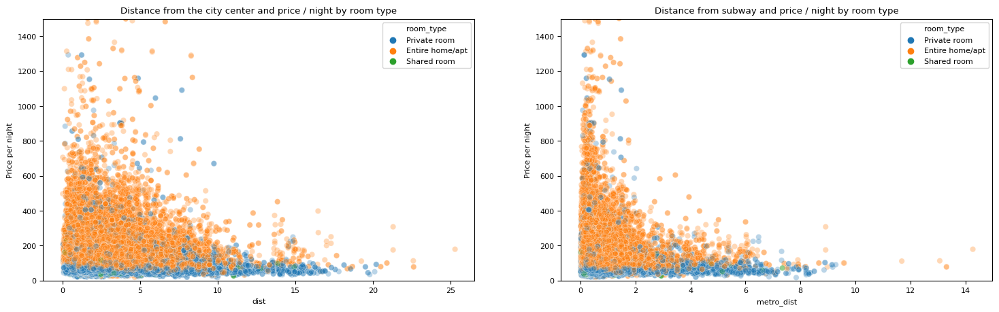

In [19]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

sns.scatterplot(ax=ax[0], data=cities, 
                x='dist', 
                y='price', 
                alpha = 0.3,
                hue = 'room_type')
ax[0].set_ylim(0, 1500)
ax[0].set_ylabel('Price per night')
ax[0].set_title('Distance from the city center and price / night by room type')

sns.scatterplot(ax=ax[1], data=cities, 
                x='metro_dist', 
                y='price', 
                alpha = 0.3, 
                hue = 'room_type')
ax[1].set_ylim(0, 1500)
ax[1].set_ylabel('Price per night')
ax[1].set_title('Distance from subway and price / night by room type')

plt.show()

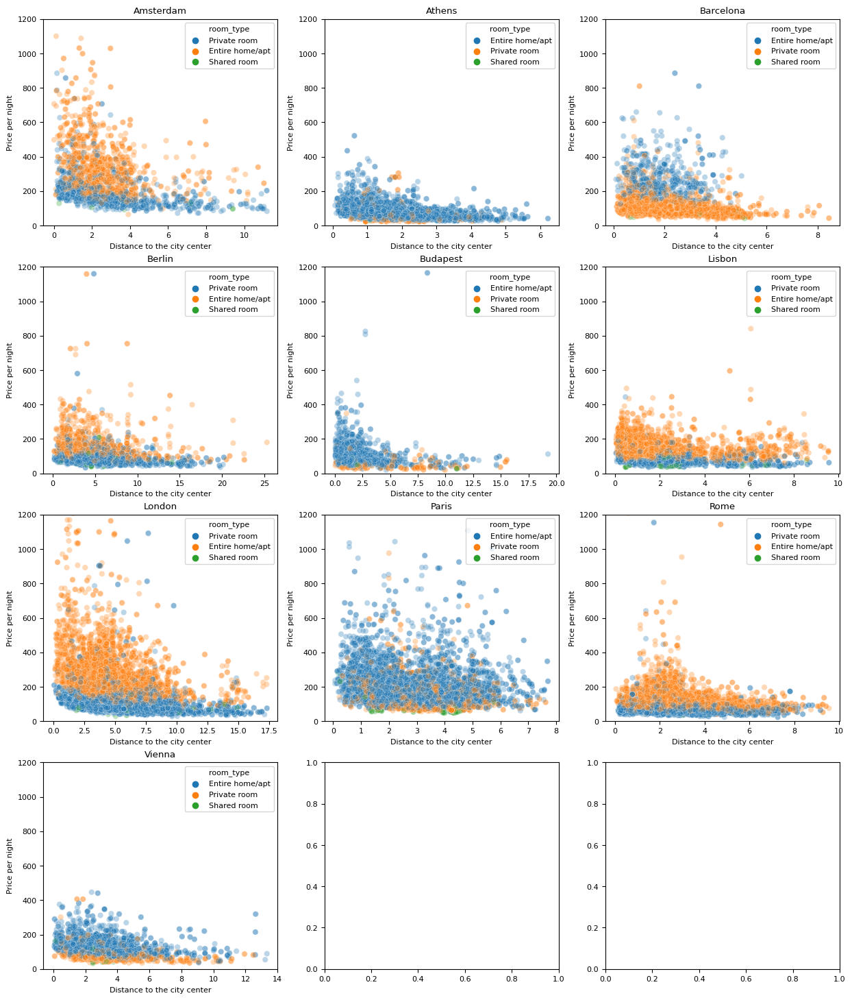

In [22]:
fig, ax = plt.subplots(4, 3, figsize = (15, 18))

axes = [ax[0,0], ax[0,1], ax[0,2], ax[1,0], ax[1,1], ax[1,2], ax[2,0], ax[2,1], ax[2,2], ax[3,0]]

for i, j in zip(city, axes):
  sns.scatterplot(data = cities[cities['city']==i], 
                x = 'dist', 
                y = 'price', 
                hue = 'room_type',
                alpha = 0.3, ax = j).\
                set(title = i,\
                    ylim = (0, 1200),\
                    ylabel = 'Price per night',\
                    xlabel = 'Distance to the city center')

plt.show()

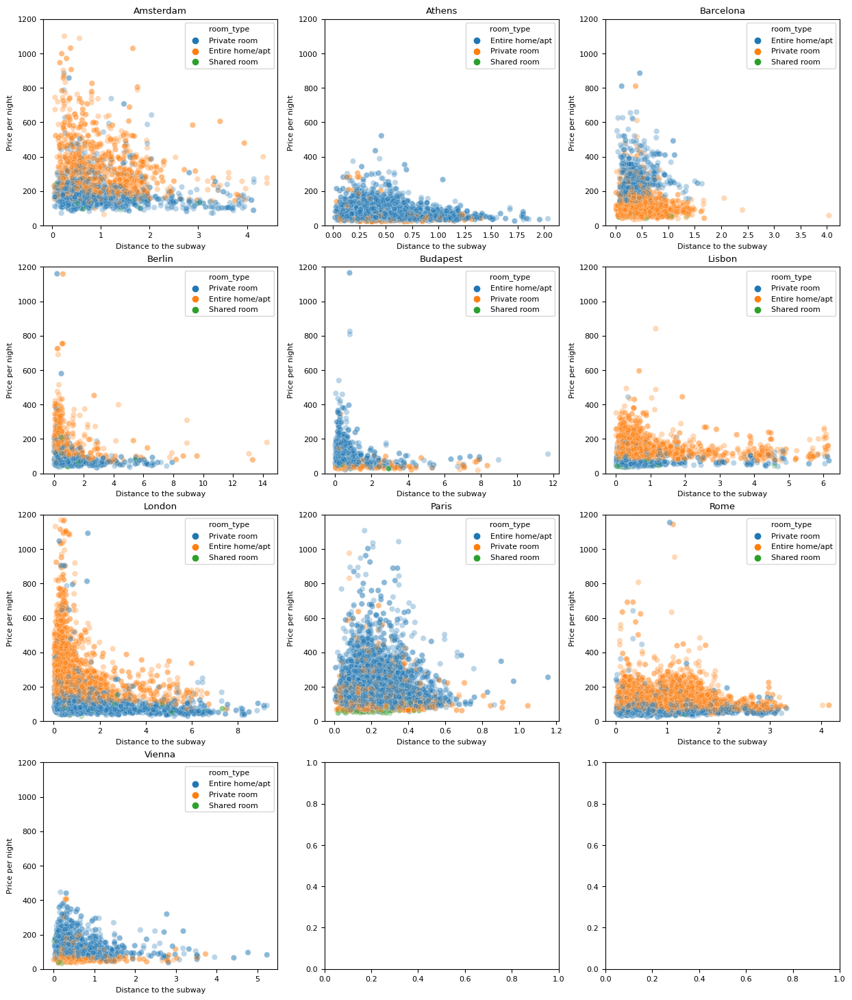

In [23]:
fig, ax = plt.subplots(4, 3, figsize = (15, 18))

axes = [ax[0,0], ax[0,1], ax[0,2], ax[1,0], ax[1,1], ax[1,2], ax[2,0], ax[2,1], ax[2,2], ax[3,0]]

for i, j in zip(city, axes):
  sns.scatterplot(data = cities[cities['city']==i], 
                x = 'metro_dist', 
                y = 'price', 
                hue = 'room_type',
                alpha = 0.3, ax = j).\
                set(title = i,\
                    ylim = (0, 1200),\
                    ylabel = 'Price per night',\
                    xlabel = 'Distance to the subway')

plt.show()

#**3. Superhost status and average ratings and prices across cities**
* Linear correlation between host status and rating is slightly positive, while Phik (𝜙 k) correlation coefficient for status with cleanliness rating is 0.32, with satisfaction rating - 0.48. This metric works better for categorical variables.
* Superhosts have greater cleanliness ratings and satisfaction ratings in all citites.
* Cities with higher share of superhosts have higher average cleanliness ratings. The same relationship is observed for average satisfaction rating, while two cities are outstanding: Rome - with relatively higher share of superhosts and lower mean satisfaction rating, Paris - with relatively lower share of superhosts and higher mean satisfaction rating.
* On average, superhosts charge more across accommodation types. But there is an outlier group - Private rooms in Amsterdam are cheaper for superhosts. This can be explained by characteristics of certain observations: distances from the city center or metro station.  

In [ ]:
print('Linear correlation between cleanliness rating and host status = ', \
      np.round(cities['cleanliness_rating'].corr(cities['host_is_superhost']),2))

print('Linear correlation between satisfaction rating and host status = ', \
      np.round(cities['guest_satisfaction_overall'].corr(cities['host_is_superhost']),2))

Linear correlation between cleanliness rating and host status =  0.27
Linear correlation between satisfaction rating and host status =  0.28


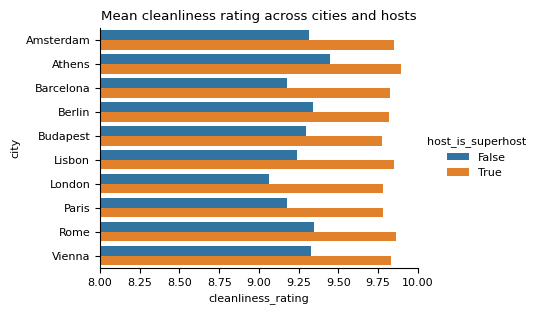

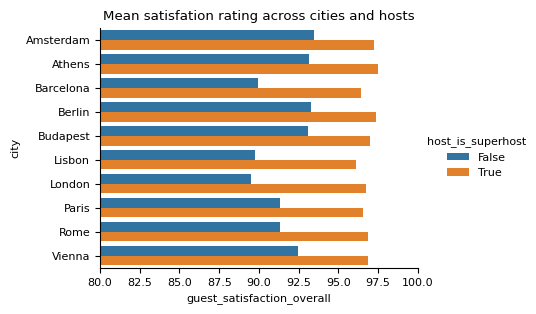

In [ ]:
ax = sns.catplot(x = 'cleanliness_rating', 
                 y = 'city', 
                 data = cities,
                 hue = 'host_is_superhost', 
                 kind = 'bar',
                 height=3, aspect=1.5, errorbar=None)
ax.set(title='Mean cleanliness rating across cities and hosts')
ax.set(xlim=(8, 10))

plt.show()

ax = sns.catplot(x = 'guest_satisfaction_overall', 
                 y = 'city', 
                 data = cities,
                 hue = 'host_is_superhost', 
                 kind = 'bar',
                 height=3, aspect=1.5, errorbar=None)
ax.set(title='Mean satisfation rating across cities and hosts')
ax.set(xlim=(80, 100))

plt.show()

In [24]:
host = cities.groupby('city')['host_is_superhost'].agg(['sum', 'count']).reset_index()
host.columns = ['city', 'superhosts', 'hosts']
host['super_share'] = host['superhosts'] * 100 / host['hosts']

rating = cities.groupby('city')[['cleanliness_rating', 'guest_satisfaction_overall']].mean().reset_index()
rating.columns = ['city', 'cleanliness_mean', 'satisfaction_mean']
rating_host = host.merge(rating, how='inner', on='city')
rating_host.sort_values(by='super_share', ascending=False, inplace=True)
rating_host

,city,superhosts,hosts,super_share,cleanliness_mean,satisfaction_mean
1,Athens,2263,5280,42.859848,9.638447,95.003598
4,Budapest,1524,4022,37.891596,9.477374,94.585281
8,Rome,2949,9027,32.668661,9.514678,93.122300
9,Vienna,1005,3537,28.413910,9.472434,93.731128
0,Amsterdam,591,2080,28.413462,9.465865,94.514423
3,Berlin,639,2484,25.724638,9.461755,94.323671
5,Lisbon,1233,5763,21.395107,9.370640,91.093875
2,Barcelona,514,2833,18.143311,9.291564,91.109072
6,London,1573,9993,15.741019,9.175023,90.645652
7,Paris,941,6688,14.069976,9.263606,92.037530


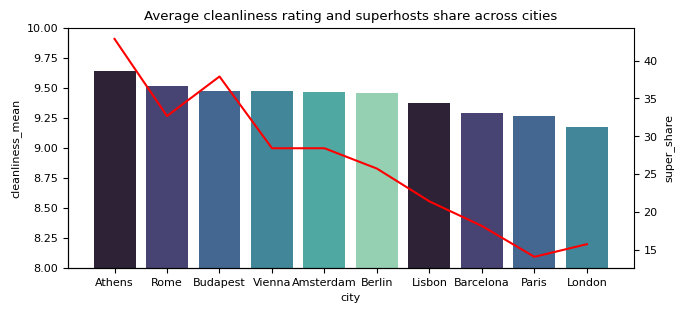

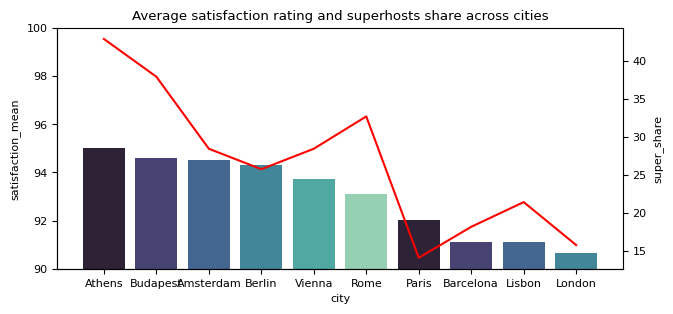

In [ ]:
# Average cleanliness rating / satisfaction rating and superhosts share across cities 
ax = sns.catplot(data=rating_host.sort_values(by='cleanliness_mean', ascending=False),
                 x='city', 
                 y='cleanliness_mean', 
                 kind='bar', 
                 height=3, aspect=2.1,
                 palette=sns.color_palette('mako')).\
                 set(title='Average cleanliness rating and superhosts share across cities')
ax.set(ylim=(8, 10))
ax2 = plt.twinx()
sns.lineplot(data=rating_host.sort_values(by='cleanliness_mean', ascending=False),
             x='city', 
             y='super_share', 
             color='red')

plt.show()

ax = sns.catplot(data=rating_host.sort_values(by='satisfaction_mean', ascending=False),
                 x='city', 
                 y='satisfaction_mean', 
                 kind='bar', 
                 height=3, aspect=2.1,
                 palette=sns.color_palette('mako')).\
                 set(title='Average satisfaction rating and superhosts share across cities')
ax.set(ylim=(90, 100))
ax2 = plt.twinx()
sns.lineplot(data=rating_host.sort_values(by='satisfaction_mean', ascending=False),
             x='city', 
             y='super_share', 
             color='red')

plt.show()

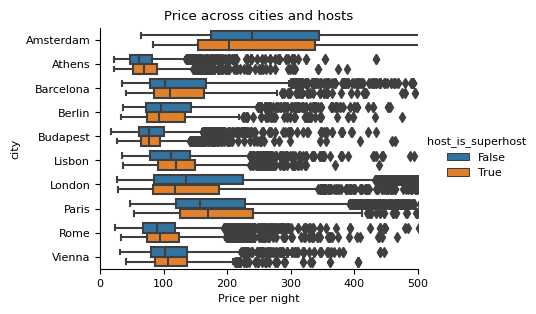

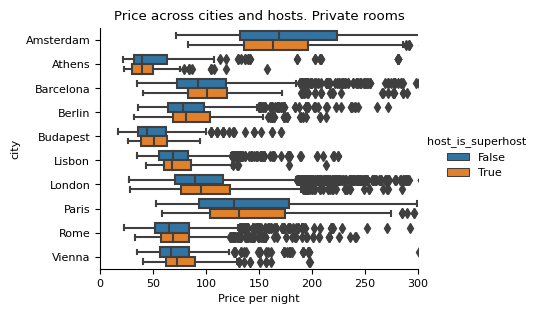

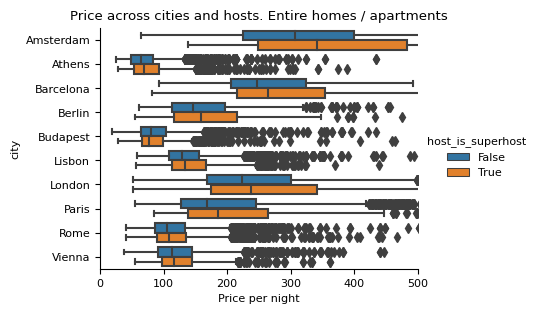

In [25]:
ax = sns.catplot(x = 'price', 
                 y = 'city', 
                 data = cities, 
                 hue = 'host_is_superhost',
                 kind = 'box', aspect = 1.5,
                 height = 3)
ax.set(title = 'Price across cities and hosts')
ax.set(xlabel = 'Price per night')
ax.set(xlim = (0, 500))
plt.show()

ax = sns.catplot(x = 'price', 
                 y = 'city', 
                 data = cities[cities['room_type']=='Private room'],
                 hue = 'host_is_superhost', 
                 kind = 'box', aspect = 1.5,
                 height = 3)
ax.set(title = 'Price across cities and hosts. Private rooms')
ax.set(xlabel = 'Price per night')
ax.set(xlim = (0, 300))
plt.show()

ax = sns.catplot(x = 'price', 
                 y = 'city', 
                 data = cities[cities['room_type']=='Entire home/apt'],
                 hue = 'host_is_superhost', 
                 kind = 'box', aspect = 1.5,
                 height = 3)
ax.set(title = 'Price across cities and hosts. Entire homes / apartments')
ax.set(xlabel = 'Price per night')
ax.set(xlim = (0, 500))
plt.show()

In [28]:
# For private rooms in Amsterdam we check the data structure across other bedrooms existance \
# in the property (multi) and distance to the city center
# For listings with other bedrooms superhosts charge more, \
# for listings without other bedrooms charge less but the median distance for these listings is longer 
amsterdam['price'] = amsterdam['realSum'] / 2
amsterdam_private_room = amsterdam[amsterdam['room_type']=='Private room']

print('Breakdown for private rooms and superhosts in Amsterdam \n', \
      amsterdam_private_room.groupby('host_is_superhost')[['price', 'dist']].agg(['count', 'median']))

Breakdown for private rooms and superhosts in Amsterdam 
                   price              dist          
                  count      median count    median
host_is_superhost                                  
False               604  168.900710   604  2.302323
True                340  162.807864   340  2.861956


#**4. Cleanliness rating and satisfaction rating. Prices and satisfaction rating.**

* There is positive correlation between cleanliness rating and satisfaction rating. Superhosts are tend to have higher ratings.

* Do higher ranked listings tend to be more expensive? There is no observed correlation between prices and satisfaction ratings.

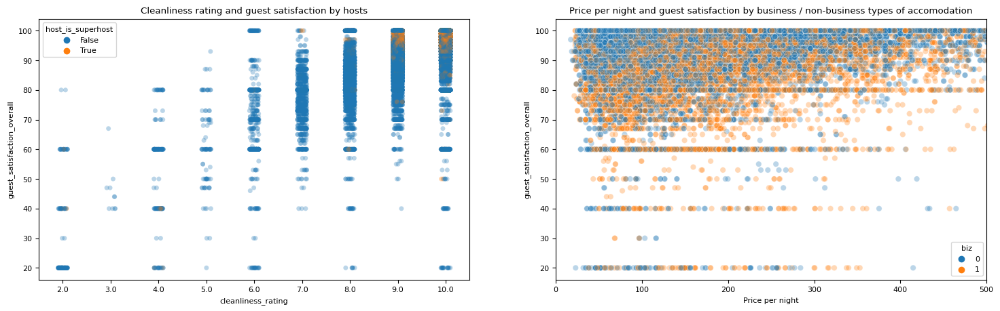

In [31]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Cleanliness rating and satisfaction rating stripplot
sns.stripplot(ax = ax[0], data = cities, 
              x = 'cleanliness_rating', 
              y = 'guest_satisfaction_overall',
              alpha = 0.3, 
              hue = 'host_is_superhost')
ax[0].set_title('Cleanliness rating and guest satisfaction by hosts')

# Prices and satisfaction rating scatter plot
sns.scatterplot(ax = ax[1], data = cities, 
                x = 'price', 
                y = 'guest_satisfaction_overall',
                alpha = 0.3, 
                hue = 'biz')
ax[1].set_title('Price per night and guest satisfaction by business / non-business types of accomodation')
ax[1].set_xlim(0,500)
ax[1].set_xlabel('Price per night')
plt.show()

# Conclusion
1. There are 51,707 Airbnb listings in the sample for 10 European cities. Top-3 cities in terms of number of listings - London, Rome, Paris, which represent almost 50% of the sample.

2. Median price per night - 106 EUR, price distribution is right-skewed with expensive outliers.

3. Sample structure:
* observations are almost evenly distributed between weekdays (49%) and weekends (51%).
* 63% - Entire homes / apartments, 36% - Private rooms, < 1% - Shared rooms.
* 26% of the hosts have Superhost status.

4. There is positive correlation between:
* price and number of bedrooms, 
* guest satisfaction rating and cleanliness rating,
* guest satisfaction rating and superhost status,
* guest satisfaction rating and business host status.

5. Sufficient price difference between weekdays and weekends is not observed. Prices differentiate more across cities and accommodation types.

6. Relationship between distances and price across accommodation types differs across cities. In some cities the correlation is not observed. In a big city like London, we see that higher prices are indicated for observations with shorter distance and for Entire home / apartments.

7. Superhosts tend to have higher ratings. And in most cases, they charge more considering accommodation types.

8. There is no observed correlation between prices and satisfaction ratings.




